# 🧨 Stable Diffusion in JAX / Flax !

🤗 Hugging Face [Diffusers](https://github.com/huggingface/diffusers) supports Flax since version `0.5.0`! This allows for super fast inference on Google TPUs, such as those available in Colab or through Google Cloud Platform.

This notebook shows how to run inference using JAX / Flax. If you want more details about how Stable Diffusion works or want to run it in GPU, please refer to [this Colab notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb).

First, make sure you are using a TPU backend. If you are running this notebook in Colab, select `Runtime` in the menu above, then select the option "Change runtime type" and then select `TPU` under the `Hardware accelerator` setting.

Note that JAX is not exclusive to TPUs, but it shines on that hardware because each TPU server has 8 TPU accelerators working in parallel.

**TODO**: screenshot.

The following cell makes sure that you are using a TPU to run this notebook. 

## Setup

In [1]:
import jax
num_devices = jax.device_count()
device_type = jax.devices()[0].device_kind

print(f"Found {num_devices} JAX devices of type {device_type}.")
assert device_type.startswith("TPU"), "Available device is not a TPU, please select TPU from Edit > Notebook settings > Hardware accelerator"

Found 8 JAX devices of type TPU v2.


Make sure `diffusers` is installed.

In [2]:
# !pip install diffusers

Then we import all the dependencies.

In [3]:
import numpy as np
import jax
import jax.numpy as jnp

from pathlib import Path
from jax import pmap
from flax.jax_utils import replicate
from flax.training.common_utils import shard
from PIL import Image

from huggingface_hub import notebook_login
from diffusers import FlaxStableDiffusionPipeline

## Model Loading

**TODO** Push weights to Hub. Update reference below.

Flax weights are available in 🤗 Hub as part of the Stable Diffusion repo. The Stable Diffusion model is distributed under the CreateML OpenRail-M license. It's an open license that claims no rights on the outputs you generate and prohibits you from deliberately producing illegal or harmful content. The [model card](https://huggingface.co/CompVis/stable-diffusion-v1-4) provides more details, so take a moment to read them and consider carefully whether you accept the license. If you do, you need to be a registered user in 🤗 Hugging Face Hub and use an access token for the code to work. You have two options to provide your access token:

* Use the `huggingface-cli login` command-line tool in your terminal and paste your token when prompted. It will be saved in a file in your computer.
* Or use `notebook_login()` in a notebook, which does the same thing.

The following cell will present a login interface unless you've already authenticated before in this computer. You'll need to paste your access token.

In [4]:
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

TPU devices support `bfloat16`, an efficient half-float type. We'll use it for our tests, but you can also use `float32` to use full precision instead.

In [5]:
dtype = jnp.bfloat16

Flax is a functional framework, so models are stateless and parameters are stored outside them. Loading the pre-trained Flax pipeline will return both the pipeline itself and the model weights (or parameters).

In [6]:
pipeline, params = FlaxStableDiffusionPipeline.from_pretrained(
    "fusing/stable-diffusion-flax-new",
    dtype=dtype,
)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

ftfy or spacy is not installed using BERT BasicTokenizer instead of ftfy.
The config attributes {'trained_betas': None} were passed to FlaxDDIMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.
tcmalloc: large alloc 3438108672 bytes == 0x72a18000 @  0x7f6458e29680 0x7f6458e4a824 0x4e5fc6 0x5a09b4 0x4f6249 0x610e01 0x5a0569 0x506a04 0x4e865b 0x4e70ca 0x505e3d 0x4e920a 0x4e70ca 0x505e3d 0x4e920a 0x4e70ca 0x4e6d57 0x4e6d09 0x594e7b 0x599711 0x4f8f94 0x4e83a1 0x50c8ec 0x4ee648 0x50c8ec 0x4ee648 0x50c8ec 0x5040bd 0x4e865b 0x4f87f3 0x4e83a1


## Inference

Since TPUs usually have 8 devices working in parallel, we'll replicate our prompt as many times as devices we have. Then we'll perform inference on the 8 devices at once, each of them being responsible for generating one image. Thus, we'll get 8 images in the same amount of time it takes for one chip to generate a single one.

After we replicate the prompt we obtain the tokenized text ids by invoking the `prepare_inputs` function of the pipeline. The length of the tokenized text is set to 77 tokens, which is the value that was used by the underlying CLIP Text model.

In [7]:
prompt = "A cinematic film still of Morgan Freeman starring as Jimi Hendrix, portrait, 40mm lens, shallow depth of field, close up, split lighting, cinematic"
num_samples = jax.device_count()
prompt = [prompt] * num_samples
prompt_ids = pipeline.prepare_inputs(prompt)
prompt_ids.shape

(8, 77)

### Replication and parallelization

Model parameters and inputs have to be replicated across the 8 parallel devices we have. The parameters dictionary is replicated using `flax.jax_utils.replicate`, which traverses the dictionary and changes the shape of the weights so they are repeated 8 times. Arrays are replicated using `shard`.

In [8]:
params = replicate(params)
prompt_ids = shard(prompt_ids)
prompt_ids.shape

(8, 1, 77)

That shape means that each one of the `8` devices will receive as an input a `jnp` array with shape `(1, 77)`. `1` is therefore the batch size per device. In TPUs with sufficient memory, it could be larger than `1` if we wanted to generate multiple images (per chip) at once.

JAX code can be compiled to an efficient representation that runs very fast. However, we need to ensure that all inputs need to have the same shape in subsequent calls; otherwise, JAX will have to compile the code again and we wouldn't be able to take advantage of the optimized speed.

`jax.pmap` does two things for us:
- Compiles (or `jit`s) the code, as if we had invoked `jax.jit()`. This does not happen when we call `pmap`, but the first time the pmapped function is invoked.
- Ensures the compiled code runs in parallel in all the available devices.

We `pmap` the `__call__` method of the pipeline, which is the one that runs inference to generate images. This way, every TPU device will receive a prompt and generate an image in parallel.

In [9]:
from functools import partial
p_sample = pmap(partial(pipeline.__call__, return_dict=False), static_broadcasted_argnums=(3,))

`static_broadcasted_argnums=(3,)` means that the value of the fourth argument in the call (the number of inference steps) is to be considered a compile-time constant. If we change it, then the code will have to be recompiled.

We are almost ready to generate images! We just need to create a random number generator to pass to the generation function. This is the standard procedure in Flax. Note that the RNG is "split" 8 times so each device receives a different generator, and therefore will create a different image.

In [10]:
rng = jax.random.PRNGKey(0)
rng = jax.random.split(rng, jax.device_count())

### Parallel generation

Remember that `p_sample` refers to a parallelized version of `pipe.__call__`, so the following code will run 8 copies of the pipeline – one per device.

The first time we run the following cell it will take a long time to compile, but subequent calls (even with different inputs) will be much faster. For example, it took about `55s` to compile in a TPU v2-8 when I tested, but then it takes about **`7s`** for future inference runs. We use `block_until_ready()` to correctly measure inference time, because JAX uses asynchronous dispatch and returns control to Python loop as soon as it can. You don't need to use that in your code; blocking will occur automatically when you want to use the result of a computation that has not yet been materialized.

In [11]:
%%time

num_inference_steps = 50
images = p_sample(prompt_ids, params, rng, num_inference_steps)[0]
images = images.block_until_ready()

CPU times: user 9min 58s, sys: 1min 16s, total: 11min 14s
Wall time: 1min


In [12]:
images.shape

(8, 1, 512, 512, 3)

## Visualization

Let's create a couple of helper functions to:
- Convert the image tensor to PIL images.
- Visualize them in a grid.

In [13]:
def images_to_pil(images):
    images = (images * 255).round().astype("uint8")
    images = np.asarray(images).reshape((num_samples, 512, 512, 3))

    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

In [14]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

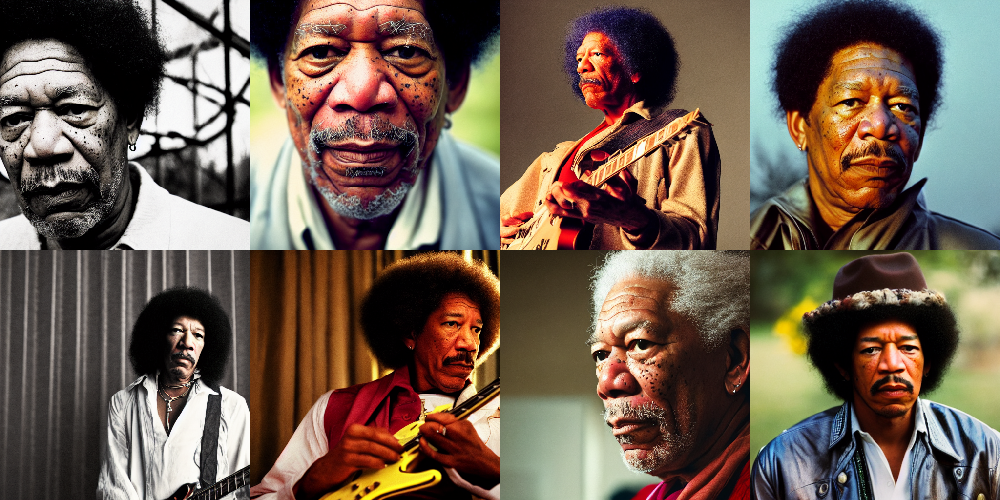

In [15]:
image_grid(images_to_pil(images), 2, 4)

## Using different prompts

We don't have to replicate the _same_ prompt in all the devices. We can do whatever we want: generate 2 prompts 4 times each, or even generate 8 different prompts at once. Let's do that!

First, we'll refactor the input preparation code into a handy function:

In [16]:
def get_input_ids(prompts):
    # For simplicity, we require that the `prompts` is a list with as many items as devices
    # We could compute the number of required repetitions ourselves; i.e., sending 2 prompts would repeat 4 times each.
    num_samples = jax.device_count()
    assert num_samples == len(prompts), f"Please, prepare your prompts as list of {num_samples} strings."

    input_ids = tokenizer(
        prompts, padding="max_length", truncation=True, max_length=77, return_tensors="jax"
    ).input_ids
    
    uncond_input_ids = tokenizer(
        [""] * num_samples, padding="max_length", truncation=True, max_length=77, return_tensors="jax"
    ).input_ids
    
    return {
        "input_ids": shard(input_ids),
        "uncond_input_ids": shard(uncond_input_ids),
    }

In [17]:
prompts = [
    "Labrador in the style of Hokusai",
    "Painting of a squirrel eating a hamburger",
    "HAL-9000 in the style of Van Gogh",
    "Times Square under water, with fish and a dolphin swimming around",
    "Ancient Roman fresco showing a man working on his laptop",
    "Close-up photograph of young black woman against urban background, high quality, bokeh",
    "Armchair in the shape of an avocado",
    "Clown astronaut in space, with Earth in the background",
]

In [18]:
prompt_ids = pipeline.prepare_inputs(prompts)
prompt_ids = shard(prompt_ids)

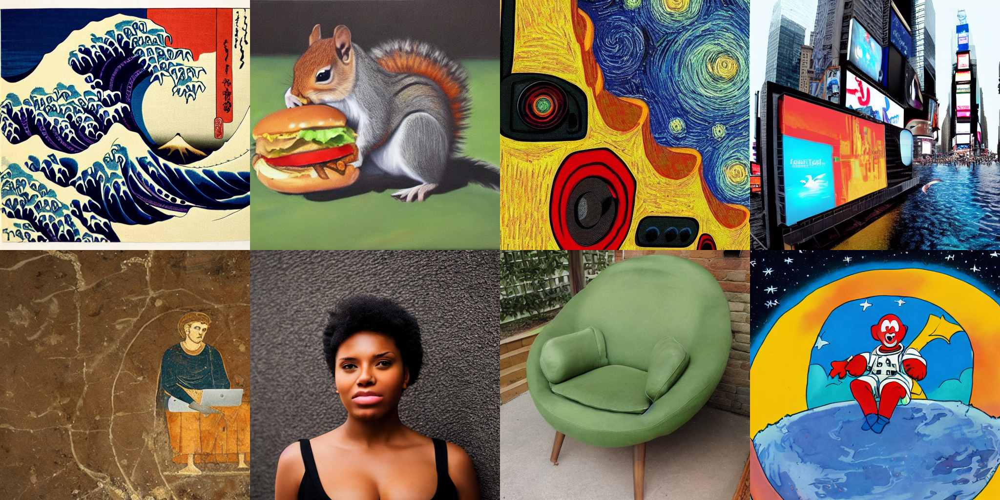

In [19]:
images = p_sample(prompt_ids, params, rng, num_inference_steps)[0]
image_grid(images_to_pil(images), 2, 4)

## TODO

- RNG. Should be returned by the pipeline.
- Safety checker.